# Лабораторная работа №2,  Компьютерная геометрия и геометрическое моделирование
- Ф.И.О: **Яссин Мохамад Аламин**.
- Ноиер студ. билета: **1032205004**.
- Группа: **НКНбд-01-20**.

In [1]:
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon, RegularPolygon
import numpy as np

## №1

## 2D Vertex Rotation

The code showcases two techniques for rotating a set of 2D vertices by a given angle:

1. **Matrix Rotation**
2. **Complex Number Arithmetic**

### Techniques:

1. **Matrix Rotation**:
   A rotation matrix is used to rotate each vertex around the origin. The matrix for a rotation by an angle \( \theta \) in 2D is:
   \[
   \begin{bmatrix}
   \cos(\theta) & -\sin(\theta) \\
   \sin(\theta) & \cos(\theta)
   \end{bmatrix}
   \]
   Multiplying this matrix with each vertex provides the rotated coordinates.

2. **Complex Number Arithmetic**:
   Each vertex (x, y) can be represented as a complex number \( x + yi \). Rotation is achieved by multiplying this complex number with another complex number representing the rotation, i.e., \( \cos(\theta) + \sin(\theta)i \).

### Example:

For a simple square with vertices at the origin and of side length 1, the rotation is demonstrated for an angle of 45 degrees. **Both** techniques produce the same rotated vertices, which confirms their equivalence.


In [2]:
def rotate_matrix(vertices, angle_deg):
    angle_rad = np.deg2rad(angle_deg)
    rotation_matrix = np.array([[np.cos(angle_rad), -np.sin(angle_rad)],
                                [np.sin(angle_rad), np.cos(angle_rad)]])
    rotated_vertices = np.dot(rotation_matrix, np.array(vertices).T).T
    return rotated_vertices

def rotate_complex(vertices, angle_deg):
    angle_rad = np.deg2rad(angle_deg)
    rotated_vertices = [(x * np.cos(angle_rad) - y * np.sin(angle_rad), x * np.sin(angle_rad) + y * np.cos(angle_rad))
                        for (x, y) in vertices]
    return rotated_vertices

# Example usage:
polygon_vertices = [(0, 0), (1, 0), (1, 1), (0, 1)]
rotation_angle = 45  # degrees

rotated_vertices_matrix = rotate_matrix(polygon_vertices, rotation_angle)
rotated_vertices_complex = rotate_complex(polygon_vertices, rotation_angle)

rotated_vertices_matrix, rotated_vertices_complex


(array([[ 0.        ,  0.        ],
        [ 0.70710678,  0.70710678],
        [ 0.        ,  1.41421356],
        [-0.70710678,  0.70710678]]),
 [(0.0, 0.0),
  (0.7071067811865476, 0.7071067811865476),
  (0.0, 1.4142135623730951),
  (-0.7071067811865476, 0.7071067811865476)])

In [3]:
# Определение вершин вашего многоугольника
polygon_vertices = [(0, 0), (1, 0), (1, 1), (0, 1)]

# Угол поворота в градусах
rotation_angle = 45  # degrees

# Поворот с использованием матричного метода
rotated_vertices_matrix = rotate_matrix(polygon_vertices, rotation_angle)

# Поворот с использованием комплексных чисел
rotated_vertices_complex = rotate_complex(polygon_vertices, rotation_angle)

# Результаты
print(rotated_vertices_matrix)
print(rotated_vertices_complex)


[[ 0.          0.        ]
 [ 0.70710678  0.70710678]
 [ 0.          1.41421356]
 [-0.70710678  0.70710678]]
[(0.0, 0.0), (0.7071067811865476, 0.7071067811865476), (0.0, 1.4142135623730951), (-0.7071067811865476, 0.7071067811865476)]


## № 2

## 2D Shape Rotation around a Specified Point

The code visualizes the rotation of a 2D shape (in this case, a triangle) around a specified point by a given angle. The rotation is achieved in three main steps:

1. **Translation**: Shift the shape such that the specified center of rotation aligns with the origin.
2. **Rotation**: Rotate the translated shape using the standard rotation matrix.
3. **Reverse Translation**: Shift the rotated shape back to its original position.

### Key Functions:

**`rotate_around_point`**:
   - Takes in the original vertices of the shape, the desired rotation angle, and the center of rotation.
   - Returns the rotated vertices after performing the three steps mentioned above.



### Example:

A triangle with vertices at `(0, 0)`, `(1, 0)`, and `(0.5, np.sqrt(3)/2)` is rotated around the point `(0.5, 0.5)` by 30 degrees. The visualization displays the original triangle, the rotated triangle, and the rotation details.



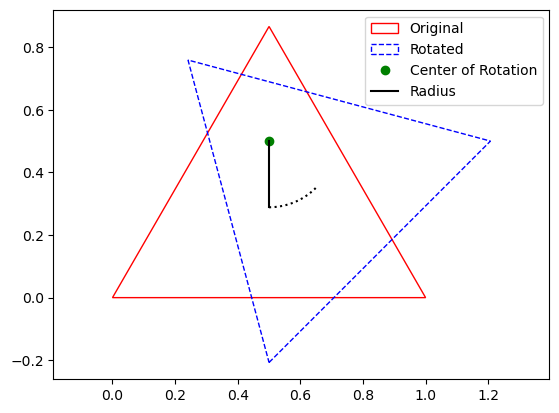

In [4]:
import matplotlib.pyplot as plt

def rotate_around_point(vertices, angle_deg, center):
    # Convert angle to radians
    angle_rad = np.deg2rad(angle_deg)

    # Translate vertices to origin
    vertices = np.array(vertices) - center

    # Apply rotation matrix
    rotation_matrix = np.array([[np.cos(angle_rad), -np.sin(angle_rad)],
                                [np.sin(angle_rad), np.cos(angle_rad)]])
    rotated_vertices = np.dot(rotation_matrix, vertices.T).T

    # Translate vertices back
    rotated_vertices += center

    return rotated_vertices

def visualize_rotation(vertices, rotated_vertices, center, angle_deg):
    # Compute center of mass of the vertices
    center_of_mass = np.mean(vertices, axis=0)

    # Create figure and axis
    fig, ax = plt.subplots()

    # Plot original and rotated polygons
    polygon = plt.Polygon(vertices, fill=None, edgecolor='r', label='Original')
    rotated_polygon = plt.Polygon(rotated_vertices, fill=None, edgecolor='b', linestyle='--', label='Rotated')
    ax.add_patch(polygon)
    ax.add_patch(rotated_polygon)

    # Plot center of rotation and radius
    ax.plot(*center, 'go', label='Center of Rotation')
    ax.plot(*zip(center, center_of_mass), 'k-', label='Radius')

    # Plot arc
    theta = np.linspace(0, np.deg2rad(angle_deg), 100)
    x_arc = center[0] + (center_of_mass[0] - center[0]) * np.cos(theta) - (center_of_mass[1] - center[1]) * np.sin(theta)
    y_arc = center[1] + (center_of_mass[0] - center[0]) * np.sin(theta) + (center_of_mass[1] - center[1]) * np.cos(theta)
    ax.plot(x_arc, y_arc, 'k:')

    # Set equal scaling and legends
    ax.axis('equal')
    ax.legend()
    plt.show()

# Example usage:
triangle_vertices = [(0, 0), (1, 0), (0.5, np.sqrt(3)/2)]
rotation_center = (0.5, 0.5)
rotation_angle = 45   # degrees

rotated_vertices = rotate_around_point(triangle_vertices, rotation_angle, rotation_center)
visualize_rotation(triangle_vertices, rotated_vertices, rotation_center, rotation_angle)


## №3

A square with vertices at `(0, 0)`, `(1, 0)`, `(1, 1)`, and `(0, 1)` is reflected over a line oriented at 180 degrees relative to the x-axis. The visualization showcases both the original and reflected squares and the reflection line.


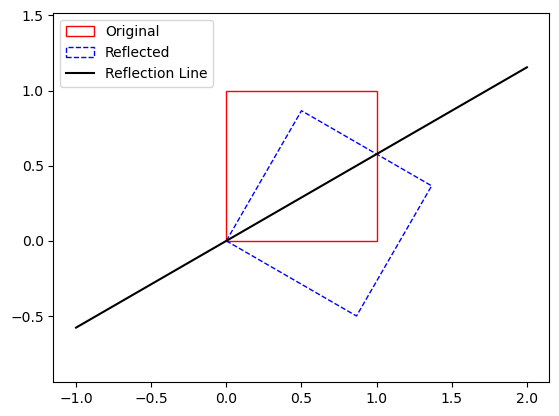

In [5]:
def reflect_polygon(vertices, angle_deg):
    # Step 1: Rotate all points to align the reflection line with the y-axis
    rotated_vertices = rotate_matrix(vertices, -angle_deg)

    # Step 2: Reflect all points over the y-axis
    reflected_vertices = [(x, -y) for (x, y) in rotated_vertices]

    # Step 3: Rotate all points back to the original orientation
    reflected_rotated_vertices = rotate_matrix(reflected_vertices, angle_deg)

    return reflected_rotated_vertices

# Example usage:
polygon_vertices = [(0, 0), (1, 0), (1, 1), (0, 1)]
reflection_angle = 30  # degrees

reflected_vertices = reflect_polygon(polygon_vertices, reflection_angle)

# Visualization
fig, ax = plt.subplots()

# Original polygon
polygon = plt.Polygon(polygon_vertices, fill=None, edgecolor='r', label='Original')
ax.add_patch(polygon)

# Reflected polygon
reflected_polygon = plt.Polygon(reflected_vertices, fill=None, edgecolor='b', linestyle='--', label='Reflected')
ax.add_patch(reflected_polygon)

# Reflection line
x = np.linspace(-1, 2, 200)
y = x * np.tan(np.deg2rad(reflection_angle))
ax.plot(x, y, 'k-', label='Reflection Line')

ax.axis('equal')
ax.legend()
plt.show()

## №4

## Animated Rotation of a Triangle

The code provides an animated visualization of a triangle rotating around a specified point in the 2D plane.

### Components:

1. **Triangle and Rotation Center**:
   The triangle has vertices defined at `(0, 0)`, `(1, 0)`, and `(0.5, np.sqrt(3)/2)`, and it rotates around the center `(0.5, 0.5)`.

2. **Rotation Function (`rotate_around_point`)**:
   This function rotates a set of vertices by a given angle around a specified center. The rotation process involves:
   - Translating the shape such that the rotation center aligns with the origin.
   - Rotating the translated shape using the rotation matrix.
   - Translating the rotated shape back to its original position.

3. **Animation**:
   The `animation.FuncAnimation` function from `matplotlib` is employed to animate the triangle's rotation. For each frame (from 0 to 359 degrees), the triangle's vertices are rotated by the corresponding angle, updating the visualization.

### Display:

The animation is rendered within a Jupyter notebook using the `HTML` module from `IPython.display`. The `rc` configuration is set to display animations using HTML5, enabling smooth playback in the notebook.




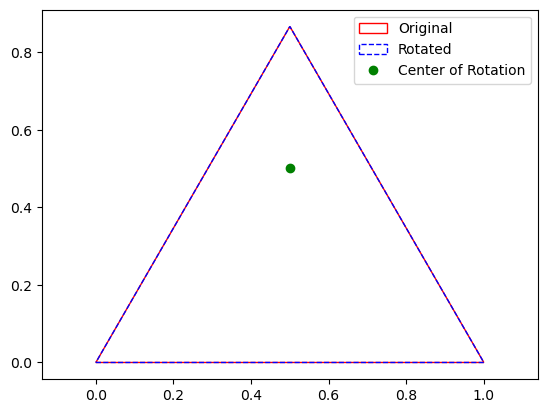

In [6]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import rc
from IPython.display import HTML
import numpy as np

# Define the polygon vertices and rotation center
triangle_vertices = [(0, 0), (1, 0), (0.5, np.sqrt(3)/2)]
rotation_center = (0.5, 0.5)

# Function to rotate the polygon
def rotate_around_point(vertices, angle_deg, center):
    angle_rad = np.deg2rad(angle_deg)
    vertices = np.array(vertices) - center
    rotation_matrix = np.array([[np.cos(angle_rad), -np.sin(angle_rad)],
                                [np.sin(angle_rad), np.cos(angle_rad)]])
    rotated_vertices = np.dot(rotation_matrix, vertices.T).T
    rotated_vertices += center
    return rotated_vertices

# Set up the figure and axis
fig, ax = plt.subplots()

# Original polygon
polygon = plt.Polygon(triangle_vertices, fill=None, edgecolor='r', label='Original')
ax.add_patch(polygon)

# Rotated polygon (initially identical to the original)
rotated_polygon = plt.Polygon(triangle_vertices, fill=None, edgecolor='b', linestyle='--', label='Rotated')
ax.add_patch(rotated_polygon)

# Center of rotation
ax.plot(*rotation_center, 'go', label='Center of Rotation')

# Set up the animation function
def animate(i):
    rotated_vertices = rotate_around_point(triangle_vertices, i, rotation_center)
    rotated_polygon.set_xy(rotated_vertices)

# Create the animation
ani = animation.FuncAnimation(fig, animate, frames=360, repeat=True)

# Set equal scaling, legends, and display the animation
ax.axis('equal')
ax.legend()

# Display the animation
rc('animation', html='html5')
HTML(ani.to_jshtml())


## №5

## Visualization of a 2D Two-Link Robotic Arm

The code provides a visualization of a simple 2D planar kinematic pair or a two-link robotic arm.

### Key Features:

1. **Links**:
   The robot consists of two links:
   - **Link 1**: Originates from a base joint and has a length `l1`.
   - **Link 2**: Attached to the end of Link 1 at the "elbow" joint and has a length `l2`.

2. **Joints**:
   - **Base Joint**: The stationary joint where Link 1 starts.
   - **Elbow Joint**: The joint connecting Link 1 and Link 2.
   - **End Effector**: The tip of Link 2, which can be used to perform tasks.

3. **Angles**:
   - **θ1**: The angle between the horizontal axis and Link 1.
   - **θ2**: The angle between Link 1 and Link 2.

### Function - `plot_kinematic_pair`:

This function takes in the lengths of the two links (`l1` and `l2`) and their respective angles (`theta1_deg` and `theta2_deg`) to visualize the position of the robotic arm:

- **Coordinate Calculation**:
  The coordinates of the joints are computed using basic trigonometry, considering the lengths of the links and their respective angles.

- **Visualization**:
  The links are visualized as straight lines between the joints, and the joints are represented as colored dots.

### Example:

In the provided example, the robotic arm has links with lengths 2 units and 1.5 units and is positioned at angles 45° and 30° respectively. Executing the code will display the configuration of the robotic arm in this position.


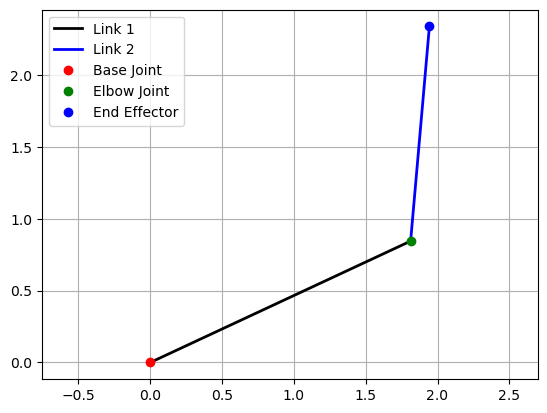

In [7]:
def plot_kinematic_pair(l1, l2, theta1_deg, theta2_deg):
    # Convert angles to radians
    theta1_rad = np.deg2rad(theta1_deg)
    theta2_rad = np.deg2rad(theta2_deg)

    # Calculate coordinates
    x1, y1 = l1 * np.cos(theta1_rad), l1 * np.sin(theta1_rad)
    x2, y2 = x1 + l2 * np.cos(theta1_rad + theta2_rad), y1 + l2 * np.sin(theta1_rad + theta2_rad)

    # Create figure and axis
    fig, ax = plt.subplots()

    # Plot links and joints
    ax.plot([0, x1], [0, y1], 'k-', linewidth=2, label='Link 1')
    ax.plot([x1, x2], [y1, y2], 'b-', linewidth=2, label='Link 2')
    ax.plot(0, 0, 'ro', label='Base Joint')
    ax.plot(x1, y1, 'go', label='Elbow Joint')
    ax.plot(x2, y2, 'bo', label='End Effector')

    # Set equal scaling, legends, and grid
    ax.axis('equal')
    ax.legend()
    ax.grid(True)
    plt.show()

# Example usage: второая синяя
plot_kinematic_pair(2, 1.5, 25, 60)


## №6

## Анимация Астроиды (Animation of an Astroid)

Код демонстрирует анимацию астроиды, которая является одним из типов гипоциклоиды, с использованием библиотеки `matplotlib`.

### Основные Параметры:

1. **R**: Радиус большого круга.
2. **r**: Радиус меньшего круга, который катится внутри большого круга.
3. **d**: Расстояние от центра меньшего круга до точки, следящей за астроидой.
4. **k, n**: Дополнительные параметры, которые в настоящее время имеют постоянные значения.

### Функции:

1. **`animate_astroid`**:
   - Эта функция создает и возвращает анимацию астроиды.
   - Она использует `FuncAnimation` из `matplotlib` для создания анимации.
   - Внутри этой функции уравнения астроиды обновляются для каждого значения `theta`, что позволяет анимировать кривую.
   


In [16]:
# Параметры астроиды из таблицы
R, r, d, k, n = 4, 1, 1, 4, 1

def animate_astroid(R, r, d, n, theta_step=0.1):
    # Создание фигуры и осей
    fig, ax = plt.subplots()

    # Настройка осей
    ax.axis('equal')
    ax.grid(True)
    ax.set_xlim([-R-r-d, R+r+d])
    ax.set_ylim([-R-r-d, R+r+d])

    # Инициализация линии для отображения кривой
    line, = ax.plot([], [], 'b-', linewidth=2)

    # Инициализация точки для отображения конечного исполнителя
    point, = ax.plot([], [], 'bo')

    # Функция инициализации анимации
    def init():
        line.set_data([], [])
        point.set_data([], [])
        return line, point

    # Функция для обновления каждого кадра анимации
    def update(frame):
        theta = np.arange(0, frame, theta_step)  # Параметр theta от 0 до текущего значения frame
        # Обновленные уравнения для астроиды
        x = (R - r) * np.cos(theta) + d * np.cos((R - r) / r * theta)
        y = (R - r) * np.sin(theta) - d * np.sin((R - r) / r * theta)
        line.set_data(x, y)
        if len(x) > 0 and len(y) > 0:  # Проверка наличия данных перед установкой положения конечного исполнителя
            point.set_data(x[-1], y[-1])
        return line, point

    # Создание анимации
    ani = animation.FuncAnimation(fig, update, frames=np.arange(0, 2*np.pi + theta_step, theta_step), init_func=init, blit=True)
    plt.close(fig)  # Закрытие фигуры, чтобы предотвратить отображение статического изображения
    return ani

ani_astroid.save('animation.gif', writer='pillow')

C:\Users\ameen\AppData\Local\Temp\ipykernel_2380\3518118095.py:34: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  point.set_data(x[-1], y[-1])


## №π

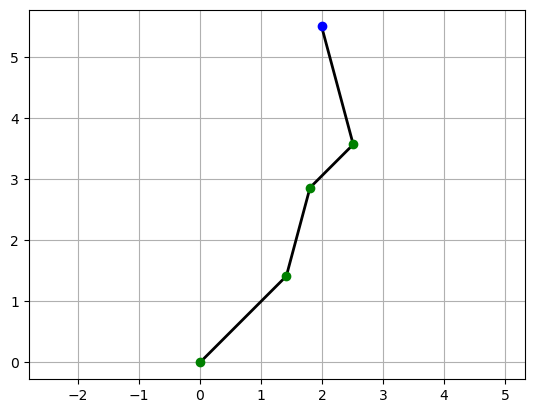

In [9]:
def plot_kinematic_chain(link_lengths, joint_angles_deg):
    # Convert joint angles to radians
    joint_angles_rad = np.deg2rad(joint_angles_deg)

    # Initialize arrays to store joint coordinates
    x_coords = [0]  # x-coordinate of each joint
    y_coords = [0]  # y-coordinate of each joint

    # Compute joint coordinates
    for i in range(len(link_lengths)):
        theta_i = np.sum(joint_angles_rad[:i+1])  # cumulative angle
        x_i = x_coords[i] + link_lengths[i] * np.cos(theta_i)
        y_i = y_coords[i] + link_lengths[i] * np.sin(theta_i)
        x_coords.append(x_i)
        y_coords.append(y_i)

    # Create figure and axis
    fig, ax = plt.subplots()

    # Plot links and joints
    for i in range(len(link_lengths)):
        ax.plot([x_coords[i], x_coords[i+1]], [y_coords[i], y_coords[i+1]], 'k-', linewidth=2)
        ax.plot(x_coords[i], y_coords[i], 'go')  # joint

    ax.plot(x_coords[-1], y_coords[-1], 'bo')  # end effector

    # Set equal scaling, grid, and display the plot
    ax.axis('equal')
    ax.grid(True)
    plt.show()

# Example usage:
link_lengths_example = [2, 1.5, 1, 2]
joint_angles_example = [45, 30, -30, 60]

plot_kinematic_chain(link_lengths_example, joint_angles_example)


## №∞

In [10]:
from math import acos, atan2

def inverse_kinematics_3DOF(target_x, target_y, l1, l2, l3):
    # Step 1: Compute the distance to the target point
    d = np.sqrt(target_x**2 + target_y**2)

    # Step 2: Check reachability
    if d > l1 + l2 + l3:
        raise ValueError("Target point is unreachable")

    # Step 3: Compute the angle between the x-axis and the line from the origin to the target point
    alpha = atan2(target_y, target_x)

    # Additional calculations for Step 4
    # Using cosine rule to find angles
    a1 = acos((l2**2 + l3**2 - d**2) / (2 * l2 * l3))
    a2 = acos((d**2 + l2**2 - l3**2) / (2 * d * l2))
    a3 = acos((d**2 + l3**2 - l2**2) / (2 * d * l3))

    # Step 4: Compute joint angles
    theta1 = alpha + a2
    theta2 = a1
    theta3 = np.pi - a1 - a3

    # Convert angles from radians to degrees
    theta1_deg = np.rad2deg(theta1)
    theta2_deg = np.rad2deg(theta2)
    theta3_deg = np.rad2deg(theta3)

    return theta1_deg, theta2_deg, theta3_deg

# Example usage:
target_x, target_y = 3, 2
l1, l2, l3 = 2, 2, 2

inverse_kinematics_3DOF(target_x, target_y, l1, l2, l3)


(59.348973799235054, 128.68218745348943, 25.658906273255305)